In [1]:
%load_ext autoreload
%autoreload 2

from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

import sys
import os
import numpy as np
import pandas as pd
if os.environ['DL_PATH'] not in sys.path:
    sys.path.append(os.environ['DL_PATH'])
from innereye.eeg.models.inception_time import InceptionTime

from pathlib import Path
import pickle as pkl

from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow import keras

from innereye.viz import scatter2c
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split

In [2]:
from sklearn.model_selection import train_test_split
datadir = Path('/home/innereye/data/EEG/sart/')
subjects=['fujinaga','hosaka','iiduka','imai','kajigaya','kobayashi','mimura','miyata','hoshiba','ikeda','kanno','kubota','nagai',
'yamashita']

def segment_raw_sart(x, isnum, is3, comm, win_sec=2, filter_probes=True, sr=150):
    win_samps = sr * win_sec
    three_idxs = np.where(is3)[0]
    trails = []
    labels = []
    for idx3 in three_idxs:           
        trail = x[idx3-win_samps:idx3, :]
        trail_isnum = isnum[idx3-win_samps:idx3]
#         trails_isnum.append(trail_isnum)
        if (not filter_probes) or ( sum(trail_isnum) >= ((win_sec // 1.1)) ):
            trails.append(trail)
            label = 1 if comm[idx3] else 0
            labels.append(label)
#         print(trail.shape)
    return np.array(trails), np.array(labels)

from sklearn.utils import shuffle
datadir = Path('/home/innereye/data/EEG/sart/')
win_sec = 2
sr = 150
n_chans = 7
# subjects=['fujinaga','hosaka','iiduka','imai','kajigaya','kobayashi','mimura','miyata','hoshiba','ikeda','kanno','kasahara','kubota','nagai',
# 'yamashita']
# s = 1
# subj = subjects[s]
all_subj_x = []
all_subj_y = []
pkl_files = [ff for ff in os.listdir(datadir) if os.path.isfile(datadir/ff) and ff.endswith('.pkl')]
# for i in range(len(subjects)):
subjs_df = pd.DataFrame(columns=['fname', 'subj', 'datasrc', 'n_trails', 'n_comms'])
for i, pklfname in enumerate(pkl_files):
    try:
        subj = pklfname.split('.')[0].split('_')[-2]
        datasrc = '_'.join(pklfname.split('.')[0].split('_')[:-2])
        subjs_df.loc[i, ['fname', 'subj', 'datasrc']] = pklfname, subj, datasrc

        d = pkl.load(open(datadir/pklfname, 'rb'))
        rawdata = d.loc[subj, 'raw']
        is_num = d.loc[subj, 'is_num']
        is_3 = d.loc[subj, 'is_3']
        comm = d.loc[subj, 'Commission']
        x_this_subj, y_this_subj = segment_raw_sart(rawdata, is_num, is_3, comm, win_sec=win_sec)
        if x_this_subj.shape[1:] != (win_sec*sr, n_chans):
            print(f'[{(pklfname)}]: invalid data shape = {x_this_subj.shape}, skipping.')
            continue
        all_subj_x.append(x_this_subj)
        all_subj_y.append(y_this_subj)
    #     print(f'[subj {i}: {len(y_this_subj)} trails, {sum(y_this_subj)} targets')
        subjs_df.loc[i, ['n_trails', 'n_comms']] = len(y_this_subj), sum(y_this_subj)
    except ValueError as e:
        print(f'Error at {subj} : {e}')
        print('skipping.')
    
x = np.concatenate(all_subj_x, axis=0)
y = np.concatenate(all_subj_y, axis=0)
x, y = shuffle(x, y)
print(x.shape , y.shape , sum(y))
x_trn, x_tst, y_trn, y_tst = train_test_split(x, y, test_size=0.2, stratify=y)
sum(y_trn), sum(y_tst)

[poc_kasahara_4yaar.pkl]: invalid data shape = (23, 0, 7), skipping.
[prepoc_oct_yoshikawa_4yaar.pkl]: invalid data shape = (75,), skipping.
(1260, 300, 7) (1260,) 560


(448, 112)

In [3]:
class SavePredsCB(tf.keras.callbacks.Callback):
    def __init__(self, x_val, preds_list):
        self.x_val = x_val
        self.preds_list = preds_list
    def on_epoch_end(self, epoch, logs=None):
        self.preds_list.append(self.model.predict(self.x_val).reshape(-1))

In [4]:
lr = 1e-4
depth = 4
n_epochs = 70
load_best_loss = False
kernel_size = 300

inxt = InceptionTime(input_shape=x.shape[1:], nb_classes=1, depth=depth, kernel_size=kernel_size, lr=lr)

ll = []
ss = SavePredsCB(x_tst, ll)
reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)
hist = inxt.model.fit(x_trn, y_trn, epochs=n_epochs, batch_size=32, validation_data=(x_tst, y_tst), callbacks=[ss, reduce_lr_cb])

Epoch 1/70
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
32/32 [==============================] - 2s 55ms/step - loss: 0.7107 - auc: 0.6403 - val_loss: 1.1241 - val_auc: 0.6968 - lr: 1.0000e-04
Epoch 2/70
32/32 [==============================] - 1s 32ms/step - loss: 0.6375 - auc: 0.7110 - val_loss: 0.7798 - val_auc: 0.7039 - lr: 1.0000e-04
Epoch 3/70
32/32 [==============================] - 1s 32ms/step - loss: 0.5873 - auc: 0.7612 - val_loss: 0.6818 - val_auc: 0.7289 - lr: 1.0000e-04
Epoch 4/70
32/32 [==============================] - 1s 30ms/step - loss: 0.5426 - auc: 0.7990 - val_loss: 0.7643 - val_auc: 0.7417 - lr: 1.0000e-04
Epoch 5/70
32/32 [==============================] - 1s 31ms/step - loss: 0.5206 - auc: 0.8195 - val_loss: 0.9592 - val_auc: 0.7407 - lr: 1.0000e-04
Epoch 6/70
32/32 [==============================] - 1s 32ms/step - loss: 0.5143 - auc: 0.8270 - val_loss: 0.7256 - val_auc: 0.7264 - lr: 1.0000e-04
Epoch 7/70
32/32 [=============

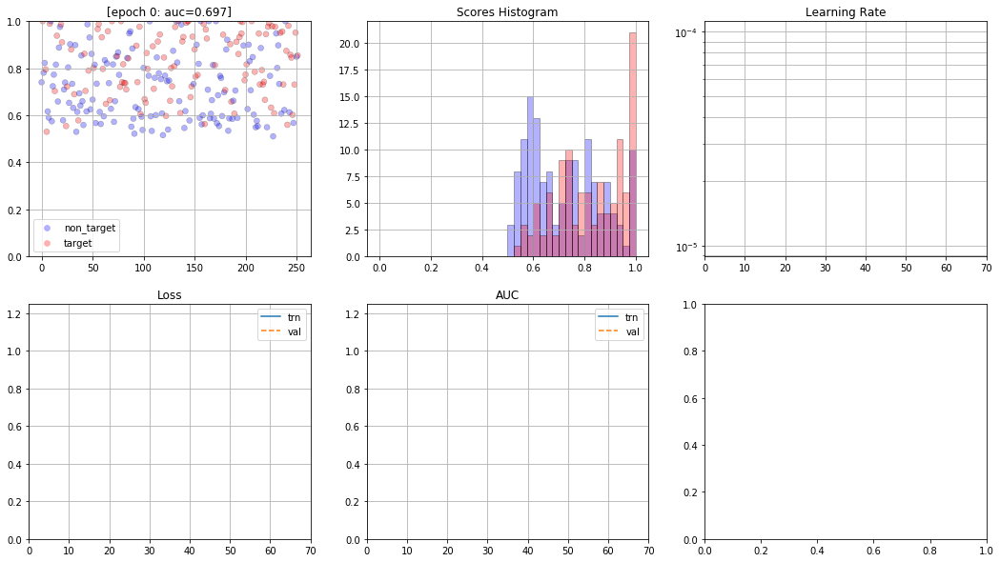

In [5]:
%matplotlib inline
import matplotlib
import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"

# ll = list of test predictions
# lrvec = vector of learning rates - lrvec = np.array(hist.history['lr'])
# lossvec = vector of learning rates

lrvec = hist.history['lr']
lossvec = np.array(hist.history['loss']) #[:20]
vallossvec = np.array(hist.history['val_loss'])# [:20]
valaucvec = hist.history['val_auc']
aucvec = hist.history['auc']

def update_plt(i):
    # scatter plot colors
    offs = np.zeros((len(ll[i]), 2))
    offs[:, 0] = np.arange(len(ll[i]))
    offs[:, 1] = ll[i]
    h.set_offsets(offs)
    auc = roc_auc_score(y_tst, ll[i])
    axes[0].set_title(f'[epoch {i}: auc={auc:.3f}]')
    
    # density / hist 
    n0, _ = np.histogram(ll[i][nontarget_idxs], hist_bins)
    n1, _ = np.histogram(ll[i][target_idxs], hist_bins)
    # for count, rect in zip(n0, bar_container_0.patches):
    for count, rect in zip(n0, bar_container_0):  
        rect.set_height(count)
    for count, rect in zip(n1, bar_container_1):
        rect.set_height(count)
    
    # lr vec
    l.set_data(tt[:i], lrvec[:i])
    axes[2].set_yscale('log')
#     axes[1].grid(which='both')

    # loss vec
    line_loss_trn.set_data(tt[:i], lossvec[:i])
    line_loss_val.set_data(tt[:i], vallossvec[:i])
    
    # auc vec
    line_auc_trn.set_data(tt[:i], aucvec[:i])
    line_auc_val.set_data(tt[:i], valaucvec[:i])
    

nrows, ncols = 2, 3    
f, axes = plt.subplots(nrows, ncols, figsize=(ncols*6, nrows*5))
axes = axes.reshape(-1)

# axes[0] - scatter colors
axes[0].set_ylim(0, 1.)
h = scatter2c(y_tst, ll[0], ax=axes[0], return_handle=True)
axes[0].grid(True)

# axes[1] - scores density / hist
density = False
hist_bins = np.arange(0., 1.025, 0.025)
n, _ = np.histogram(ll[0], hist_bins, density=density)
target_idxs = np.where(y_tst)[0]
nontarget_idxs = np.where(y_tst == 0)[0]
_, _, bar_container_0 = axes[1].hist(ll[0][nontarget_idxs], hist_bins, lw=1, alpha=0.3, fc='blue', ec='black', density=density)
_, _, bar_container_1 = axes[1].hist(ll[0][target_idxs], hist_bins, lw=1, alpha=0.3, fc='red', ec='black', density=density)
axes[1].grid(True)
axes[1].set_title('Scores Histogram')

# axes[2] - lr
axes[2].yaxis.set_major_formatter(plt.FormatStrFormatter('%.0e'))
l, = axes[2].plot([0], [lrvec[0]])
axes[2].set_xlim(0, len(lrvec))
# axes[2].set_yscale('log')
axes[2].grid(which='both')
axes[2].set_title('Learning Rate')
tt = np.arange(len(lrvec))

# axes[3] - loss:
line_loss_trn, = axes[3].plot([0], [lossvec[0]], label='trn')
line_loss_val, = axes[3].plot([0], [vallossvec[0]], '--', label='val')
axes[3].set_xlim(0, len(lossvec))
axes[3].set_title('Loss')
axes[3].grid(True)
axes[3].legend()
axes[3].set_ylim(0, max(max(lossvec), max(vallossvec)))

# axes[4] - auc:
line_auc_trn, = axes[4].plot([0], [aucvec[0]], label='trn')
line_auc_val, = axes[4].plot([0], [valaucvec[0]], '--', label='val')
axes[4].set_xlim(0, len(lossvec))
axes[4].set_title('AUC')
axes[4].grid(True)
axes[4].legend()
axes[4].set_ylim(0, max(max(lossvec), max(vallossvec)))

ani = matplotlib.animation.FuncAnimation(f, update_plt, frames=len(ll))
ani
# update_plt(6)

In [6]:
inxt.model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 300, 7)]     0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 300, 32)      224         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling1d (MaxPooling1D)    (None, 300, 7)       0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 300, 32)      307200      conv1d[0][0]                     
______________________________________________________________________________________________

In [7]:
from innereye.eeg.models.train import fit1cycle
from innereye.data.gens import arrays_gen

inxt_f1c = InceptionTime(input_shape=x.shape[1:], nb_classes=1, depth=depth, kernel_size=kernel_size, lr=lr)
fitdict = fit1cycle(inxt_f1c.model, epochs=n_epochs, min_epoch=10, max_lr=1e-3, max_auc_val=True,
                          gen_trn=arrays_gen(x_trn, labels=y_trn), steps_trn=(len(x_trn)//32)+1, 
                          gen_val=arrays_gen(x_tst, labels=y_tst), steps_val=(len(x_tst)//32)+1,
                          save_val_loss=True, save_preds=True)
# fit1cycle(inxt.model, gen_trn, steps_trn)
# fit1cycle(model, gen_trn, steps_trn, gen_val=None, steps_val=None, max_lr=1e-3, start_lr=None, min_lr=None,
#               inc_period=0.3, moms=(0.95,0.85), epochs=50, max_auc_val=True, min_epoch=-1, save_val_loss=False,
#               model_name_str='', verbose=True):
    

[fit1c ]: epoch=0, lr=4.536120341193839e-05, val_auc=0.69
[fit1c ]: epoch=1, lr=6.13250532226524e-05, val_auc=0.70
[fit1c ]: epoch=2, lr=8.753494340683887e-05, val_auc=0.72
[fit1c ]: epoch=3, lr=0.00012340538832832245, val_auc=0.72
[fit1c ]: epoch=4, lr=0.00016813510152168345, val_auc=0.73
[fit1c ]: epoch=5, lr=0.0002207248951078079, val_auc=0.71
[fit1c ]: epoch=6, lr=0.00028, val_auc=0.73
[fit1c ]: epoch=7, lr=0.0003446363083041303, val_auc=0.71
[fit1c ]: epoch=8, lr=0.0004131899517009691, val_auc=0.69
[fit1c ]: epoch=9, lr=0.00048412955507851627, val_auc=0.72
[fit1c ]: epoch=10, lr=0.0005558704449214836, val_auc=0.72
[fit1c ]: epoch=11, lr=0.0006268100482990309, val_auc=0.69
[fit1c ]: epoch=12, lr=0.0006953636916958697, val_auc=0.72
[fit1c ]: epoch=13, lr=0.0007599999999999999, val_auc=0.65
[fit1c ]: epoch=14, lr=0.0008192751048921921, val_auc=0.66
[fit1c ]: epoch=15, lr=0.0008718648984783166, val_auc=0.68
[fit1c ]: epoch=16, lr=0.0009165946116716775, val_auc=0.70
[fit1c ]: epoch=17,

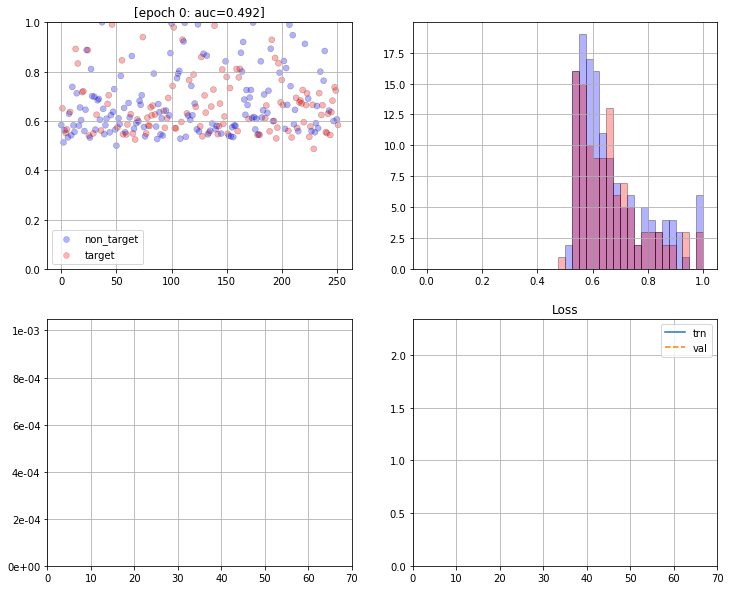

In [11]:
%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"

lrvec = fitdict['lr_vec'][0::32]  # resample from each batch to each epoch
lossvec = fitdict['trn_loss_vec']
vallossvec = fitdict['val_loss_vec']
preds_list = fitdict['preds']


# ll = list of test predictions
# lrvec = vector of learning rates - lrvec = np.array(hist.history['lr'])
# lossvec = vector of learning rates


def update_plt(i):
    # scatter plot colors
    offs = np.zeros((len(preds_list[i]), 2))
    offs[:, 0] = np.arange(len(preds_list[i]))
    offs[:, 1] = preds_list[i]
    h.set_offsets(offs)
    auc = roc_auc_score(y_tst, preds_list[i])
    axes[0].set_title(f'[epoch {i}: auc={auc:.3f}]')
    
    # density / hist 
    n0, _ = np.histogram(preds_list[i][nontarget_idxs], hist_bins)
    n1, _ = np.histogram(preds_list[i][target_idxs], hist_bins)
    # for count, rect in zip(n0, bar_container_0.patches):
    for count, rect in zip(n0, bar_container_0):  
        rect.set_height(count)
    for count, rect in zip(n1, bar_container_1):
        rect.set_height(count)
    
    # lr vec
    l.set_data(tt[:i], lrvec[:i])
#     axes[2].set_yscale('log')
#     axes[1].grid(which='both')

    # loss vec
    line_loss_trn.set_data(tt[:i], lossvec[:i])
    line_loss_val.set_data(tt[:i], vallossvec[:i])
nrows, ncols = 2, 2    
f, axes = plt.subplots(2, 2, figsize=(ncols*6, nrows*5))
axes = axes.reshape(-1)

# axes[0] - scatter colors
axes[0].set_ylim(0, 1.)
h = scatter2c(y_tst, preds_list[0], ax=axes[0], return_handle=True)
axes[0].grid(True)

# axes[1] - scores density / hist
density = False
hist_bins = np.arange(0., 1.025, 0.025)
n, _ = np.histogram(preds_list[0], hist_bins, density=density)
target_idxs = np.where(y_tst)[0]
nontarget_idxs = np.where(y_tst == 0)[0]
_, _, bar_container_0 = axes[1].hist(preds_list[0][nontarget_idxs], hist_bins, lw=1, alpha=0.3, fc='blue', ec='black', density=density)
_, _, bar_container_1 = axes[1].hist(preds_list[0][target_idxs], hist_bins, lw=1, alpha=0.3, fc='red', ec='black', density=density)
axes[1].grid(True)

# axes[2] - lr
axes[2].yaxis.set_major_formatter(plt.FormatStrFormatter('%.0e'))
l, = axes[2].plot([0], [lrvec[0]])
axes[2].set_xlim(0, len(lrvec))
# axes[2].set_yscale('log')
axes[2].grid(which='both')
axes[2].set_ylim(0., max(lrvec)*1.05)
tt = np.arange(len(lrvec))

# axes[3] - loss:
line_loss_trn, = axes[3].plot([0], [lossvec[0]], label='trn')
line_loss_val, = axes[3].plot([0], [vallossvec[0]], '--', label='val')
axes[3].set_xlim(0, len(lossvec))
axes[3].set_title('Loss')
axes[3].grid(True)
axes[3].legend()
axes[3].set_ylim(0, max(max(lossvec), max(vallossvec)))

ani = matplotlib.animation.FuncAnimation(f, update_plt, frames=len(preds_list))
ani
# update_plt(6)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])

animate = lambda i: l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
ani

In [ ]:
# density = False
# hist_bins = np.arange(0., 1.025, 0.025)
# n, _ = np.histogram(ll[0], hist_bins, density=density)
# f, aa = plt.subplots()
# aa.grid()
# target_idxs = np.where(y_tst)[0]
# nontarget_idxs = np.where(y_tst == 0)[0]

# _, _, bar_container_0 = aa.hist(ll[0][nontarget_idxs], hist_bins, lw=1, alpha=0.3, fc='blue', ec='black', density=density)
# _, _, bar_container_1 = aa.hist(ll[0][target_idxs], hist_bins, lw=1, alpha=0.3, fc='red', ec='black', density=density)

# # bar_container_0[0].set_height(70)
# # ll[0]